# 텍스트 처리

In [43]:
import tensorflow as tf

import warnings
warnings.filterwarnings('always')
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn import datasets

In [44]:
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
    except RuntimeError as e:
    # 프로그램 시작시에 메모리 증가가 설정되어야만 합니다
        print(e)

In [3]:
!pwd

/home/lab11


In [4]:
!mkdir data

In [5]:
%cd data

/home/lab11/data


In [8]:
!wget http://mng.bz/0tIo --no-check-certificate

--2022-02-11 11:46:02--  http://mng.bz/0tIo
Resolving mng.bz (mng.bz)... 35.166.24.88
Connecting to mng.bz (mng.bz)|35.166.24.88|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://mng.bz/0tIo [following]
--2022-02-11 11:46:02--  https://mng.bz/0tIo
Connecting to mng.bz (mng.bz)|35.166.24.88|:443... connected.
  Unable to locally verify the issuer's authority.
HTTP request sent, awaiting response... 301 
Location: http://s3.amazonaws.com/text-datasets/aclImdb.zip [following]
--2022-02-11 11:46:02--  http://s3.amazonaws.com/text-datasets/aclImdb.zip
Resolving s3.amazonaws.com (s3.amazonaws.com)... 52.217.141.224
Connecting to s3.amazonaws.com (s3.amazonaws.com)|52.217.141.224|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 60711700 (58M) [application/zip]
Saving to: ‘0tIo’

0tIo                100%[===================>]  57.90M  10.7MB/s    in 6.3s    

2022-02-11 11:46:09 (9.21 MB/s) - ‘0tIo’ saved [60711700/6071170

In [11]:
!unzip 0tIo

Archive:  0tIo
   creating: aclImdb/
  inflating: aclImdb/.DS_Store       
   creating: __MACOSX/
   creating: __MACOSX/aclImdb/
  inflating: __MACOSX/aclImdb/._.DS_Store  
   creating: aclImdb/test/
  inflating: aclImdb/test/.DS_Store  
   creating: __MACOSX/aclImdb/test/
  inflating: __MACOSX/aclImdb/test/._.DS_Store  
   creating: aclImdb/test/neg/
  inflating: aclImdb/test/neg/0_2.txt  
   creating: __MACOSX/aclImdb/test/neg/
  inflating: __MACOSX/aclImdb/test/neg/._0_2.txt  
  inflating: aclImdb/test/neg/10000_4.txt  
  inflating: __MACOSX/aclImdb/test/neg/._10000_4.txt  
  inflating: aclImdb/test/neg/10001_1.txt  
  inflating: __MACOSX/aclImdb/test/neg/._10001_1.txt  
  inflating: aclImdb/test/neg/10002_3.txt  
  inflating: __MACOSX/aclImdb/test/neg/._10002_3.txt  
  inflating: aclImdb/test/neg/10003_3.txt  
  inflating: __MACOSX/aclImdb/test/neg/._10003_3.txt  
  inflating: aclImdb/test/neg/10004_2.txt  
  inflating: __MACOSX/aclImdb/test/neg/._10004_2.txt  
  inflating: aclImdb

In [12]:
!ls

0tIo  __MACOSX	aclImdb  index.html


In [13]:
!pwd

/home/lab11/data


In [15]:
import os

dir_path = '/home/lab11/data/aclImdb'
file_path = os.path.join( dir_path, 'train/neg')
file_name = os.listdir(file_path)[0]
with open( os.path.join(file_path, file_name), 'r') as f:
    print(f.read())

Forbidden Siren is based upon the Siren 2 Playstation 2 (so many 2s) game. Like most video game turned movies, I would say the majority don't translate into a different medium really well. And that goes for this one too, painfully.<br /><br />There's a pretty long prologue which explains and sets the premise for the story, and the mysterious island on which a writer (Leo Morimoto) and his children, daughter Yuki (Yui Ichikawa) and son Hideo (Jun Nishiyama) come to move into. The villagers don't look all too friendly, and soon enough, sound advice is given about the siren on the island, to stay indoors once the siren starts wailing.<br /><br />Naturally and slowly, things start to go bump, and our siblings go on a mission beating around the bush to discover exactly what is happening on this unfriendly island with its strange inhabitants. But in truth, you will not bother with what's going on, as folklore and fairy tales get thrown in to convolute the plot even more. What was really push

In [16]:
dir_path = '/home/lab11/data/aclImdb'
train_dir_path = os.path.join( dir_path, 'train')

labels = []
texts = []

for label_type in ['neg', 'pos']:
  dir_name = os.path.join( train_dir_path, label_type )
  for fname in os.listdir( dir_name ):
    # 폴더 내에 .txt가 아닌 파일도 있는 것 같습니다.
    if fname[-4:] == '.txt': # 확장자가 .txt인 경우에만 처리
      with open( os.path.join( dir_name, fname), 'r' ) as f:
        texts.append( f.read() )
      # 'neg' 폴더에서 가져오면 레이블은 0 'pos' 폴더에서 가져오면 레이블은 1
      if label_type == 'neg': labels.append(0)
      else: labels.append(1)

In [17]:
texts[:2]

["Forbidden Siren is based upon the Siren 2 Playstation 2 (so many 2s) game. Like most video game turned movies, I would say the majority don't translate into a different medium really well. And that goes for this one too, painfully.<br /><br />There's a pretty long prologue which explains and sets the premise for the story, and the mysterious island on which a writer (Leo Morimoto) and his children, daughter Yuki (Yui Ichikawa) and son Hideo (Jun Nishiyama) come to move into. The villagers don't look all too friendly, and soon enough, sound advice is given about the siren on the island, to stay indoors once the siren starts wailing.<br /><br />Naturally and slowly, things start to go bump, and our siblings go on a mission beating around the bush to discover exactly what is happening on this unfriendly island with its strange inhabitants. But in truth, you will not bother with what's going on, as folklore and fairy tales get thrown in to convolute the plot even more. What was really pu

## 토크나이징
- 전체 데이터에서 200개의 학습 데이터만 가지고 훈련(학습)을 진행
  - 앞에서 이미지 처리할때와 마찬가지로 적은 데이터를 활용하는 방법
  - 사전학습된 워드 임베딩을 사용
  - 특정 문자열에 특화된 워드 임베딩을 사용하면 더 정확하겠지만, 속도가 느립니다.

In [20]:
from tensorflow.keras.preprocessing.text import Tokenizer

In [21]:
maxLen = 100 # 100개의 단어만 사용
max_words = 10000 # 주어진 학습 셋에서 빈도가 가장 높은 10000개의 단어만 사용

training_samples = 200
validation_samples = 10000 # 일부러 과적합 하려고 한 것 같습니다.

tokenizer = Tokenizer(num_words=max_words)
tokenizer.fit_on_texts(texts)
sequence = tokenizer.texts_to_sequences(texts)

# 정수 리스트를 (samples, maxLen) 크기의 2D 정수 텐서로 변환
data = tf.keras.preprocessing.sequence.pad_sequences( sequence, maxlen = maxLen )
labels = np.asarray( labels )

In [22]:
data.shape

(25000, 100)

In [23]:
labels.shape

(25000,)

In [24]:
# 부정 리뷰 이후에 긍정 리뷰가 이어지기 때문에
# 샘플링 하기 위해서 데이터를 무작위로 섞은 이후에 200개의 샘플을 추출

# 전체 데이터의 개수만큼 수열을 생성
indices = np.arange( data.shape[0] ) 
print( indices )

# 생성된 수열을 섞어줍니다.
np.random.shuffle( indices )
print( indices )

data = data[indices]
labels = labels[indices]

# 학습자료와 검증 자료로 분할
x_train = data[:training_samples]
y_train = labels[:training_samples]
x_validation = data[training_samples: training_samples + validation_samples]
y_validation = labels[training_samples: training_samples + validation_samples]

[    0     1     2 ... 24997 24998 24999]
[13612  4048 16000 ... 10310 13701 17248]


In [25]:
print(x_train.shape)
print(x_validation.shape)

(200, 100)
(10000, 100)


분류 모형에서 제일 좋은 형태는 각 클래스의 비율이 1:1인 형태가 가장 이상적인 형태

In [26]:
np.unique(y_train, return_counts=True)

(array([0, 1]), array([ 94, 106]))

- 적절한 비율로 잘 섞인 것 같습니다.
- 과적합은 되겠지만 적어도 데이터의 불균형 문제는 없을 것 같습니다. 

## 사전학습된 워드 임베딩
- GloVe 단어 임베딩을 사용
  - 2014년에 위키피디아를 이용해서 사전에 계산된 단어 임베딩
  - 압축된 파일의 용량이 800메가 정도 된다고 하네요
  - 이번에는 구글 드라이브로 바로 다운로드 해서 압축을 풀어 줄게요
  - 400,000개의 단어에 대한 100차원의 임베딩 벡터를 포함

In [27]:
!pwd

/home/lab11/data


In [28]:
path = '/home/lab11/data'
%cd '{path}'
%pwd

/home/lab11/data


'/home/lab11/data'

In [29]:
!wget https://nlp.stanford.edu/data/glove.6B.zip

--2022-02-11 13:08:48--  https://nlp.stanford.edu/data/glove.6B.zip
Resolving nlp.stanford.edu (nlp.stanford.edu)... 171.64.67.140
Connecting to nlp.stanford.edu (nlp.stanford.edu)|171.64.67.140|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: http://downloads.cs.stanford.edu/nlp/data/glove.6B.zip [following]
--2022-02-11 13:08:49--  http://downloads.cs.stanford.edu/nlp/data/glove.6B.zip
Resolving downloads.cs.stanford.edu (downloads.cs.stanford.edu)... 171.64.64.22
Connecting to downloads.cs.stanford.edu (downloads.cs.stanford.edu)|171.64.64.22|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 862182613 (822M) [application/zip]
Saving to: ‘glove.6B.zip’

glove.6B.zip        100%[===================>] 822.24M  4.93MB/s    in 2m 48s  

2022-02-11 13:11:37 (4.90 MB/s) - ‘glove.6B.zip’ saved [862182613/862182613]



In [30]:
!unzip glove.6B.zip

Archive:  glove.6B.zip
  inflating: glove.6B.50d.txt        
  inflating: glove.6B.100d.txt       
  inflating: glove.6B.200d.txt       
  inflating: glove.6B.300d.txt       


임베딩 전처리

In [31]:
file_path = '/home/lab11/data/glove.6B.100d.txt'

# 파일에 뭐가 들어있는지 확인해봅시다.
with open( file_path, 'r') as f:
  print( f.readline() )

the -0.038194 -0.24487 0.72812 -0.39961 0.083172 0.043953 -0.39141 0.3344 -0.57545 0.087459 0.28787 -0.06731 0.30906 -0.26384 -0.13231 -0.20757 0.33395 -0.33848 -0.31743 -0.48336 0.1464 -0.37304 0.34577 0.052041 0.44946 -0.46971 0.02628 -0.54155 -0.15518 -0.14107 -0.039722 0.28277 0.14393 0.23464 -0.31021 0.086173 0.20397 0.52624 0.17164 -0.082378 -0.71787 -0.41531 0.20335 -0.12763 0.41367 0.55187 0.57908 -0.33477 -0.36559 -0.54857 -0.062892 0.26584 0.30205 0.99775 -0.80481 -3.0243 0.01254 -0.36942 2.2167 0.72201 -0.24978 0.92136 0.034514 0.46745 1.1079 -0.19358 -0.074575 0.23353 -0.052062 -0.22044 0.057162 -0.15806 -0.30798 -0.41625 0.37972 0.15006 -0.53212 -0.2055 -1.2526 0.071624 0.70565 0.49744 -0.42063 0.26148 -1.538 -0.30223 -0.073438 -0.28312 0.37104 -0.25217 0.016215 -0.017099 -0.38984 0.87424 -0.72569 -0.51058 -0.52028 -0.1459 0.8278 0.27062



In [32]:
file_path = '/home/lab11/data/glove.6B.100d.txt'
embedding_index = {}
with open( file_path, 'r') as f:
  for line in f:
    values = line.split()
    word = values[0]
    coefs = np.asarray( values[1:], dtype='float32')
    embedding_index[word] = coefs

In [33]:
embedding_index.keys()

dict_keys(['the', ',', '.', 'of', 'to', 'and', 'in', 'a', '"', "'s", 'for', '-', 'that', 'on', 'is', 'was', 'said', 'with', 'he', 'as', 'it', 'by', 'at', '(', ')', 'from', 'his', "''", '``', 'an', 'be', 'has', 'are', 'have', 'but', 'were', 'not', 'this', 'who', 'they', 'had', 'i', 'which', 'will', 'their', ':', 'or', 'its', 'one', 'after', 'new', 'been', 'also', 'we', 'would', 'two', 'more', "'", 'first', 'about', 'up', 'when', 'year', 'there', 'all', '--', 'out', 'she', 'other', 'people', "n't", 'her', 'percent', 'than', 'over', 'into', 'last', 'some', 'government', 'time', '$', 'you', 'years', 'if', 'no', 'world', 'can', 'three', 'do', ';', 'president', 'only', 'state', 'million', 'could', 'us', 'most', '_', 'against', 'u.s.', 'so', 'them', 'what', 'him', 'united', 'during', 'before', 'may', 'since', 'many', 'while', 'where', 'states', 'because', 'now', 'city', 'made', 'like', 'between', 'did', 'just', 'national', 'day', 'country', 'under', 'such', 'second', 'then', 'company', 'group

In [34]:
len(embedding_index)

400000

In [35]:
embedding_index['for']

array([-1.4401e-01,  3.2554e-01,  1.4257e-01, -9.9227e-02,  7.2536e-01,
        1.9321e-01, -2.4188e-01,  2.0223e-01, -8.9599e-01,  1.5215e-01,
        3.5963e-02, -5.9513e-01, -5.1635e-02, -1.4428e-02,  3.5475e-01,
       -3.1859e-01,  7.6984e-01, -8.7369e-02, -2.4762e-01,  6.5059e-01,
       -1.5138e-01, -4.2703e-01,  1.8813e-01,  9.1562e-02,  1.5192e-01,
        1.1303e-01, -1.5222e-01, -6.2786e-01, -2.3923e-01,  9.6009e-02,
       -4.6147e-01,  4.1526e-01, -3.0475e-01,  1.3710e-01,  1.6758e-01,
        5.3301e-01, -4.3658e-02,  8.5924e-01, -4.1192e-01, -2.1394e-01,
       -5.1228e-01, -3.1945e-01,  1.2662e-01, -3.1510e-01,  3.1429e-03,
        2.7129e-01,  1.7328e-01, -1.3159e+00, -4.2414e-01, -6.9126e-01,
        1.9017e-02, -1.3375e-01, -9.6057e-02,  1.7069e+00, -6.5291e-01,
       -2.6111e+00,  2.6518e-01, -6.1178e-01,  2.0950e+00,  3.8148e-01,
       -5.5823e-01,  2.0360e-01, -3.3704e-01,  3.7354e-01,  6.9510e-01,
       -1.6370e-03,  8.1885e-01,  5.1793e-01,  2.7746e-01, -3.71

In [36]:
# 그럼 10000 x 100 차원의 임베딩 행렬을 생성
embedding_dim = 100
embedding_matrix = np.zeros((max_words, embedding_dim))

word_index = tokenizer.word_index
for word, idx in word_index.items():
  embedding_vector = embedding_index.get(word)
  if idx < max_words:
    # 임베딩 인덱스에 없는 단어는 0
    if embedding_vector is not None: embedding_matrix[idx] = embedding_vector

## 정리

In [37]:
# IMDB 영화리뷰로 부터 생성된 정수 인덱스
len(word_index)

88582

Embdding layer는 단어들의 가중치를 계산(단어의 빈도수)

In [38]:
# 위키피디아의 단어들을 대상으로 미리 계산된 가중치를 가져와서 사용
print( len(embedding_index) )
print( len(embedding_index['the']))

400000
100


IMDB의 정수 인덱스와 사전학습된 임베딩 벡터를 하나로 합쳐서 최적으로 임베딩 행렬을 완성

In [39]:
embedding_matrix.shape

(10000, 100)

In [40]:
embedding_matrix

array([[ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [-0.038194  , -0.24487001,  0.72812003, ..., -0.1459    ,
         0.82779998,  0.27061999],
       [-0.071953  ,  0.23127   ,  0.023731  , ..., -0.71894997,
         0.86894   ,  0.19539   ],
       ...,
       [-0.36003   , -0.21944   ,  0.19735999, ..., -0.39333999,
        -0.76525003, -0.30943999],
       [-0.18295   ,  0.21077   ,  0.077446  , ..., -0.55996001,
        -0.2138    ,  0.75924999],
       [-0.13887   ,  1.09119999, -0.48866999, ...,  0.78184998,
         0.90399998,  0.38177001]])

## 네트워크 정의

In [46]:
model = tf.keras.models.Sequential()
model.add( tf.keras.layers.Embedding( max_words, embedding_dim, input_length=maxLen) )
model.add( tf.keras.layers.Flatten() )
model.add( tf.keras.layers.Dense( 32, activation='relu'))
model.add( tf.keras.layers.Dense( 1, activation='sigmoid'))

In [47]:
model.layers[0].set_weights([embedding_matrix])
model.layers[0].trainable = False # 가중치가 업데이트 되지 않도록 고정

In [48]:
model.compile(
    loss='binary_crossentropy',
    metrics=['acc'],
    optimizer='rmsprop'
)

In [49]:
hist = model.fit(x_train, y_train, epochs=10, batch_size=32, validation_data=(x_validation, y_validation))

2022-02-11 13:23:10.111720: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:116] None of the MLIR optimization passes are enabled (registered 2)
2022-02-11 13:23:10.112183: I tensorflow/core/platform/profile_utils/cpu_utils.cc:112] CPU Frequency: 2499995000 Hz


Epoch 1/10


2022-02-11 13:23:10.650724: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcublas.so.11


1/7 [===>..........................] - ETA: 8s - loss: 0.9536 - acc: 0.4688

2022-02-11 13:23:11.501739: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcublasLt.so.11


7/7 [==============================] - 2s 121ms/step - loss: 2.0162 - acc: 0.4626 - val_loss: 0.7189 - val_acc: 0.5012
Epoch 2/10
7/7 [==============================] - 1s 89ms/step - loss: 0.5851 - acc: 0.6068 - val_loss: 0.6951 - val_acc: 0.5378
Epoch 3/10
7/7 [==============================] - 1s 93ms/step - loss: 0.5038 - acc: 0.7626 - val_loss: 0.7028 - val_acc: 0.5145
Epoch 4/10
7/7 [==============================] - 1s 91ms/step - loss: 0.4418 - acc: 0.8614 - val_loss: 0.7538 - val_acc: 0.5025
Epoch 5/10
7/7 [==============================] - 1s 94ms/step - loss: 0.3119 - acc: 0.9450 - val_loss: 0.7614 - val_acc: 0.5211
Epoch 6/10
7/7 [==============================] - 1s 89ms/step - loss: 0.2580 - acc: 0.9289 - val_loss: 0.9381 - val_acc: 0.5009
Epoch 7/10
7/7 [==============================] - 1s 94ms/step - loss: 0.2936 - acc: 0.8847 - val_loss: 0.7918 - val_acc: 0.5179
Epoch 8/10
7/7 [==============================] - 1s 91ms/step - loss: 0.1286 - acc: 1.0000 - val_loss: 0.7

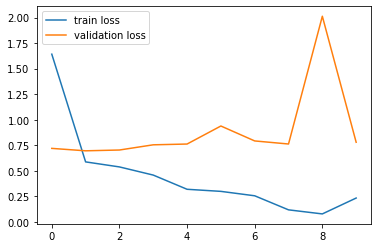

In [52]:
plt.plot( hist.history['loss'], label='train loss')
plt.plot( hist.history['val_loss'], label='validation loss')
plt.legend()
plt.show()

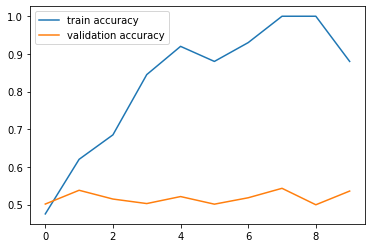

In [51]:
plt.plot( hist.history['acc'], label='train accuracy')
plt.plot( hist.history['val_acc'], label='validation accuracy')
plt.legend()
plt.show()

In [53]:
dir_path = '/home/lab11/data/aclImdb'
train_dir_path = os.path.join( dir_path, 'test')

labels = []
texts = []

for label_type in ['neg', 'pos']:
  dir_name = os.path.join( train_dir_path, label_type )
  for fname in os.listdir( dir_name ):
    if fname[-4:] == '.txt':
      with open( os.path.join( dir_name, fname), 'r' ) as f:
        texts.append( f.read() )
      if label_type == 'neg': labels.append(0)
      else: labels.append(1)

In [54]:
maxLen = 100 # 100개의 단어만 사용

sequence = tokenizer.texts_to_sequences(texts)
x_test = tf.keras.preprocessing.sequence.pad_sequences( sequence, maxlen = maxLen )
y_test = np.asarray( labels )

In [55]:
model.evaluate( x_test, y_test )

782/782 [==============================] - 1s 2ms/step - loss: 0.7902 - acc: 0.5307


[0.7902105450630188, 0.5307199954986572]

- 테스트 정확도는 겨우 50%가 조금 넘습니다
- 적은 수의 샘플로 작업을 하는 일은 매우 어렵습니다

# NSMC(Naver Sentiment Movie Corpus)
- 네이버 영화 리뷰를 이용한 학습 셋
  - 긍정 리뷰와 부정 리뷰를 미리 레이블링

In [56]:
!pip install konlpy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.4/19.4 MB 73.2 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.4/6.4 MB 101.9 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 449.0/449.0 KB 46.3 MB/s eta 0:00:00


In [58]:
from konlpy.tag import Kkma, Komoran, Okt

In [59]:
!pwd

/home/lab11/data


In [63]:
!wget https://raw.githubusercontent.com/e9t/nsmc/master/ratings_train.txt

--2022-02-11 14:10:37--  https://raw.githubusercontent.com/e9t/nsmc/master/ratings_train.txt
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.109.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 14628807 (14M) [text/plain]
Saving to: ‘ratings_train.txt’

ratings_train.txt   100%[===================>]  13.95M  60.8MB/s    in 0.2s    

2022-02-11 14:10:37 (60.8 MB/s) - ‘ratings_train.txt’ saved [14628807/14628807]



In [64]:
!wget https://raw.githubusercontent.com/e9t/nsmc/master/ratings_test.txt

--2022-02-11 14:10:46--  https://raw.githubusercontent.com/e9t/nsmc/master/ratings_test.txt
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.109.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4893335 (4.7M) [text/plain]
Saving to: ‘ratings_test.txt’

ratings_test.txt    100%[===================>]   4.67M  --.-KB/s    in 0.02s   

2022-02-11 14:10:46 (285 MB/s) - ‘ratings_test.txt’ saved [4893335/4893335]



In [68]:
with open('./ratings_train.txt') as f:
    train = [line.split('\t') for line in f.readlines()][1:]

train

[['9976970', '아 더빙.. 진짜 짜증나네요 목소리', '0\n'],
 ['3819312', '흠...포스터보고 초딩영화줄....오버연기조차 가볍지 않구나', '1\n'],
 ['10265843', '너무재밓었다그래서보는것을추천한다', '0\n'],
 ['9045019', '교도소 이야기구먼 ..솔직히 재미는 없다..평점 조정', '0\n'],
 ['6483659',
  '사이몬페그의 익살스런 연기가 돋보였던 영화!스파이더맨에서 늙어보이기만 했던 커스틴 던스트가 너무나도 이뻐보였다',
  '1\n'],
 ['5403919', '막 걸음마 뗀 3세부터 초등학교 1학년생인 8살용영화.ㅋㅋㅋ...별반개도 아까움.', '0\n'],
 ['7797314', '원작의 긴장감을 제대로 살려내지못했다.', '0\n'],
 ['9443947',
  '별 반개도 아깝다 욕나온다 이응경 길용우 연기생활이몇년인지..정말 발로해도 그것보단 낫겟다 납치.감금만반복반복..이드라마는 가족도없다 연기못하는사람만모엿네',
  '0\n'],
 ['7156791', '액션이 없는데도 재미 있는 몇안되는 영화', '1\n'],
 ['5912145', '왜케 평점이 낮은건데? 꽤 볼만한데.. 헐리우드식 화려함에만 너무 길들여져 있나?', '1\n'],
 ['9008700', '걍인피니트가짱이다.진짜짱이다♥', '1\n'],
 ['10217543', '볼때마다 눈물나서 죽겠다90년대의 향수자극!!허진호는 감성절제멜로의 달인이다~', '1\n'],
 ['5957425', '울면서 손들고 횡단보도 건널때 뛰쳐나올뻔 이범수 연기 드럽게못해', '0\n'],
 ['8628627', '담백하고 깔끔해서 좋다. 신문기사로만 보다 보면 자꾸 잊어버린다. 그들도 사람이었다는 것을.', '1\n'],
 ['9864035',
  '취향은 존중한다지만 진짜 내생에 극장에서 본 영화중 가장 노잼 노감동임 스토리도 어거지고 감동도 어거지',
  '0\n'],
 ['6852435', 'ㄱ냥 매번 긴장되고 재밋음ㅠㅠ'

In [69]:
with open('./ratings_test.txt') as f:
    test = [line.split('\t') for line in f.readlines()][1:]

test

[['6270596', '굳 ㅋ', '1\n'],
 ['9274899', 'GDNTOPCLASSINTHECLUB', '0\n'],
 ['8544678', '뭐야 이 평점들은.... 나쁘진 않지만 10점 짜리는 더더욱 아니잖아', '0\n'],
 ['6825595', '지루하지는 않은데 완전 막장임... 돈주고 보기에는....', '0\n'],
 ['6723715', '3D만 아니었어도 별 다섯 개 줬을텐데.. 왜 3D로 나와서 제 심기를 불편하게 하죠??', '0\n'],
 ['7898805', '음악이 주가 된, 최고의 음악영화', '1\n'],
 ['6315043', '진정한 쓰레기', '0\n'],
 ['6097171', '마치 미국애니에서 튀어나온듯한 창의력없는 로봇디자인부터가,고개를 젖게한다', '0\n'],
 ['8932678',
  '갈수록 개판되가는 중국영화 유치하고 내용없음 폼잡다 끝남 말도안되는 무기에 유치한cg남무 아 그립다 동사서독같은 영화가 이건 3류아류작이다',
  '0\n'],
 ['6242223', '이별의 아픔뒤에 찾아오는 새로운 인연의 기쁨 But, 모든 사람이 그렇지는 않네..', '1\n'],
 ['7462111', '괜찮네요오랜만포켓몬스터잼밌어요', '1\n'],
 ['8425305', '한국독립영화의 한계 그렇게 아버지가 된다와 비교됨', '0\n'],
 ['6900881',
  '청춘은 아름답다 그 아름다움은 이성을 흔들어 놓는다. 찰나의 아름다움을 잘 포착한 섬세하고 아름다운 수채화같은 퀴어영화이다.',
  '1\n'],
 ['9629375', '눈에 보이는 반전이었지만 영화의 흡인력은 사라지지 않았다.', '1\n'],
 ['9037756',
  '"""스토리, 연출, 연기, 비주얼 등 영화의 기본 조차 안된 영화에 무슨 평을 해. 이런 영화 찍고도 김문옥 감독은 """"내가 영화 경력이 몇OO인데 조무래기들이 내 영화를 평론해?"""" 같은 마인드에 빠져있겠지?"""',
  '0\n'],
 ['10268521', 

In [70]:
print(len(train), len(test))

150000 50000


## 한글 전처리

In [73]:
import re

In [76]:
def cleanText(text):
    ret = re.sub("[^ㄱ-ㅎㅏ-ㅣ가-힣 ]", '', text)
    return ret

In [74]:
train[11]

['10217543', '볼때마다 눈물나서 죽겠다90년대의 향수자극!!허진호는 감성절제멜로의 달인이다~', '1\n']

In [77]:
cleanText(train[11][1])

'볼때마다 눈물나서 죽겠다년대의 향수자극허진호는 감성절제멜로의 달인이다'

In [79]:
train_clean = []

for line in train:
    train_clean.append([cleanText(line[1]), int(line[2])])

train_clean

[['아 더빙 진짜 짜증나네요 목소리', 0],
 ['흠포스터보고 초딩영화줄오버연기조차 가볍지 않구나', 1],
 ['너무재밓었다그래서보는것을추천한다', 0],
 ['교도소 이야기구먼 솔직히 재미는 없다평점 조정', 0],
 ['사이몬페그의 익살스런 연기가 돋보였던 영화스파이더맨에서 늙어보이기만 했던 커스틴 던스트가 너무나도 이뻐보였다', 1],
 ['막 걸음마 뗀 세부터 초등학교 학년생인 살용영화ㅋㅋㅋ별반개도 아까움', 0],
 ['원작의 긴장감을 제대로 살려내지못했다', 0],
 ['별 반개도 아깝다 욕나온다 이응경 길용우 연기생활이몇년인지정말 발로해도 그것보단 낫겟다 납치감금만반복반복이드라마는 가족도없다 연기못하는사람만모엿네',
  0],
 ['액션이 없는데도 재미 있는 몇안되는 영화', 1],
 ['왜케 평점이 낮은건데 꽤 볼만한데 헐리우드식 화려함에만 너무 길들여져 있나', 1],
 ['걍인피니트가짱이다진짜짱이다', 1],
 ['볼때마다 눈물나서 죽겠다년대의 향수자극허진호는 감성절제멜로의 달인이다', 1],
 ['울면서 손들고 횡단보도 건널때 뛰쳐나올뻔 이범수 연기 드럽게못해', 0],
 ['담백하고 깔끔해서 좋다 신문기사로만 보다 보면 자꾸 잊어버린다 그들도 사람이었다는 것을', 1],
 ['취향은 존중한다지만 진짜 내생에 극장에서 본 영화중 가장 노잼 노감동임 스토리도 어거지고 감동도 어거지', 0],
 ['ㄱ냥 매번 긴장되고 재밋음ㅠㅠ', 1],
 ['참 사람들 웃긴게 바스코가 이기면 락스코라고 까고바비가 이기면 아이돌이라고 깐다그냥 까고싶어서 안달난것처럼 보인다', 1],
 ['굿바이 레닌 표절인것은 이해하는데 왜 뒤로 갈수록 재미없어지냐', 0],
 ['이건 정말 깨알 캐스팅과 질퍽하지않은 산뜻한 내용구성이 잘 버무러진 깨알일드', 1],
 ['약탈자를 위한 변명 이라 저놈들은 착한놈들 절대 아닌걸요', 1],
 ['나름 심오한 뜻도 있는 듯 그냥 학생이 선생과 놀아나는 영화는 절대 아님', 1],
 ['보면서 웃지 않는 건 불가능하다', 1

In [80]:
test_clean = []

for line in test:
    test_clean.append([cleanText(line[1]), int(line[2])])

test_clean

[['굳 ㅋ', 1],
 ['', 0],
 ['뭐야 이 평점들은 나쁘진 않지만 점 짜리는 더더욱 아니잖아', 0],
 ['지루하지는 않은데 완전 막장임 돈주고 보기에는', 0],
 ['만 아니었어도 별 다섯 개 줬을텐데 왜 로 나와서 제 심기를 불편하게 하죠', 0],
 ['음악이 주가 된 최고의 음악영화', 1],
 ['진정한 쓰레기', 0],
 ['마치 미국애니에서 튀어나온듯한 창의력없는 로봇디자인부터가고개를 젖게한다', 0],
 ['갈수록 개판되가는 중국영화 유치하고 내용없음 폼잡다 끝남 말도안되는 무기에 유치한남무 아 그립다 동사서독같은 영화가 이건 류아류작이다',
  0],
 ['이별의 아픔뒤에 찾아오는 새로운 인연의 기쁨  모든 사람이 그렇지는 않네', 1],
 ['괜찮네요오랜만포켓몬스터잼밌어요', 1],
 ['한국독립영화의 한계 그렇게 아버지가 된다와 비교됨', 0],
 ['청춘은 아름답다 그 아름다움은 이성을 흔들어 놓는다 찰나의 아름다움을 잘 포착한 섬세하고 아름다운 수채화같은 퀴어영화이다', 1],
 ['눈에 보이는 반전이었지만 영화의 흡인력은 사라지지 않았다', 1],
 ['스토리 연출 연기 비주얼 등 영화의 기본 조차 안된 영화에 무슨 평을 해 이런 영화 찍고도 김문옥 감독은 내가 영화 경력이 몇인데 조무래기들이 내 영화를 평론해 같은 마인드에 빠져있겠지',
  0],
 ['소위 ㅈ문가라는 평점은 뭐냐', 1],
 ['최고', 1],
 ['발연기 도저히 못보겠다 진짜 이렇게 연기를 못할거라곤 상상도 못했네', 0],
 ['나이스', 1],
 ['별 재미도없는거 우려먹어  챔프에서 방송 몇번했더라  ㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋ', 0],
 ['일의 금요일 나이트메어시리즈와 함께 가장 많은 시리즈를 양산해냈던 헬레이저 시리즈의 첫편 작가의 상상력이 돋보이는 작품이며 갈고리로 사지찢는 고어씬은 지금보더라도 상당히 잔인하고 충격적이다',
  1],
 ['나름 교훈돋기는 하지만 어쩔수없이 저평점 받을수밖에 없는 저질섹스코미디', 0],
 ['꽤 재밌게 본

## 불용처 처리

In [81]:
!wget https://bab2min.tistory.com/attachment/cfile2.uf@241D6F475873C2B1010DEA.txt

--2022-02-11 14:38:05--  https://bab2min.tistory.com/attachment/cfile2.uf@241D6F475873C2B1010DEA.txt
Resolving bab2min.tistory.com (bab2min.tistory.com)... 211.249.222.33
Connecting to bab2min.tistory.com (bab2min.tistory.com)|211.249.222.33|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://t1.daumcdn.net/cfile/tistory/241D6F475873C2B101?download [following]
--2022-02-11 14:38:06--  https://t1.daumcdn.net/cfile/tistory/241D6F475873C2B101?download
Resolving t1.daumcdn.net (t1.daumcdn.net)... 23.33.33.201, 23.33.33.177, 2600:140b:400::1721:209b, ...
Connecting to t1.daumcdn.net (t1.daumcdn.net)|23.33.33.201|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2171 (2.1K) [text/plain]
Saving to: ‘cfile2.uf@241D6F475873C2B1010DEA.txt’

cfile2.uf@241D6F475 100%[===================>]   2.12K  --.-KB/s    in 0s      

2022-02-11 14:38:06 (349 MB/s) - ‘cfile2.uf@241D6F475873C2B1010DEA.txt’ saved [2171/2171]



In [82]:
!mv cfile2.uf@241D6F475873C2B1010DEA.txt stopwords.txt

In [85]:
stopwords = []
with open('./stopwords.txt') as f:
    stopwords = [line.split('\t')[0] for line in f.readlines()]

stopwords[:10]

['이', '있', '하', '것', '들', '그', '되', '수', '이', '보']

## 토크나이징
- 형태소 분석, 불용어 처리

In [86]:
okt = Okt()

In [87]:
okt.morphs(train_clean[0][0])

['아', '더빙', '진짜', '짜증나네요', '목소리']

In [92]:
train_token = []

for line in train_clean:
    pre = [word for word in okt.morphs(line[0]) if word not in stopwords and len(word) > 1]
    train_token.append([pre, line[1]])

In [93]:
train_token[:2]

[[['더빙', '진짜', '짜증나네요', '목소리'], 0],
 [['포스터', '보고', '초딩', '영화', '오버', '연기', '조차', '가볍지', '않구나'], 1]]

In [96]:
test_token = []

for line in test_clean:
    pre = [word for word in okt.morphs(line[0]) if word not in stopwords and len(word) > 1]
    test_token.append([pre, line[1]])

In [98]:
test_token[:5]

[[[], 1],
 [[], 0],
 [['평점', '나쁘진', '않지만', '더욱', '아니잖아'], 0],
 [['지루하지는', '않은데', '완전', '막장', '주고', '보기', '에는'], 0],
 [['아니었어도', '다섯', '줬을텐데', '나와서', '심기', '불편하게', '하죠'], 0]]

In [94]:
import pickle

In [95]:
with open('./nsmc_train_preprocess.pk', 'wb') as f:
    pickle.dump(train_token, f)

In [99]:
with open('./nsmc_test_preprocess.pk', 'wb') as f:
    pickle.dump(test_token, f)

입력변수와 타겟변수 분리, 결측치 처리

In [102]:
x_train = [line[0] for line in train_token if len(line[0]) > 1]
y_train = [int(line[1]) for line in train_token if len(line[0]) > 1]

In [103]:
x_test = [line[0] for line in test_token if len(line[0]) > 1]
y_test = [int(line[1]) for line in test_token if len(line[0]) > 1]

In [106]:
print(len(x_train), len(y_train))
print(len(x_test), len(y_test))

140490 140490
46939 46939


정수 인덱스 생성

In [107]:
tokenizer = Tokenizer()
tokenizer.fit_on_texts(x_train)
tokenizer.word_index

{'영화': 1,
 '너무': 2,
 '정말': 3,
 '진짜': 4,
 '으로': 5,
 '에서': 6,
 '연기': 7,
 '평점': 8,
 '최고': 9,
 '스토리': 10,
 '드라마': 11,
 '이다': 12,
 '감동': 13,
 '보고': 14,
 '하는': 15,
 '하고': 16,
 '배우': 17,
 'ㅋㅋ': 18,
 '감독': 19,
 '그냥': 20,
 '재미': 21,
 '내용': 22,
 '까지': 23,
 '보다': 24,
 '없는': 25,
 '쓰레기': 26,
 '봤는데': 27,
 '작품': 28,
 '사랑': 29,
 '없다': 30,
 '마지막': 31,
 '좋은': 32,
 '같은': 33,
 '이건': 34,
 '입니다': 35,
 '완전': 36,
 '있는': 37,
 'ㅠㅠ': 38,
 '처음': 39,
 'ㅋㅋㅋ': 40,
 '장면': 41,
 '액션': 42,
 '주인공': 43,
 '이렇게': 44,
 '보는': 45,
 '최악': 46,
 '이야기': 47,
 '봐도': 48,
 '느낌': 49,
 '연출': 50,
 '인데': 51,
 '없고': 52,
 'ㅡㅡ': 53,
 '명작': 54,
 '역시': 55,
 '별로': 56,
 '많이': 57,
 '재밌게': 58,
 '이해': 59,
 '이영화': 60,
 '라고': 61,
 '보면': 62,
 '이나': 63,
 '부터': 64,
 '해서': 65,
 '보기': 66,
 '에게': 67,
 '아깝다': 68,
 '이고': 69,
 '무슨': 70,
 '기억': 71,
 '결말': 72,
 '같다': 73,
 'ㅎㅎ': 74,
 '마음': 75,
 '인생': 76,
 '소재': 77,
 '없이': 78,
 '수준': 79,
 '현실': 80,
 '한번': 81,
 '가장': 82,
 '매력': 83,
 '한다': 84,
 '반전': 85,
 '전개': 86,
 '라는': 87,
 '한국': 88,
 '남자': 89,
 '가슴': 90,
 '되는':

In [108]:
len(tokenizer.word_index)

97587

In [111]:
total_cnt = len(tokenizer.word_index)
total_freq = 0

rare_cnt = 0
rare_freq = 0

for key, value in tokenizer.word_counts.items():
    total_freq += value
    
    if value < 3:
        rare_cnt += 1
        rare_freq += value

In [113]:
print(f'전체 단어 집합: {total_cnt}')
print(f'2번 이하로 사용된 단어 집합: {rare_cnt}')
print(f'2번 이하로 사용된 단어 집합의 비율: {rare_cnt / total_cnt * 100}')
print(f'2번 이하로 사용된 단어 출현 비율: {rare_freq / total_freq * 100}')

전체 단어 집합: 97587
2번 이하로 사용된 단어 집합: 66716
2번 이하로 사용된 단어 집합의 비율: 68.36566345927224
2번 이하로 사용된 단어 출현 비율: 6.545433312471678


- 전체 단어 중 2번 이하로 사용된 단어는 68% 정도로 절반 이상을 차지
- 하지만 이 단어들이 실제로는 6.5%만 사용

In [114]:
max_words = total_cnt - rare_cnt + 1
max_words

30872

In [116]:
tokenizer = Tokenizer(max_words)
tokenizer.fit_on_texts(x_train)
x_train = tokenizer.texts_to_sequences(x_train)
x_test = tokenizer.texts_to_sequences(x_test)

In [119]:
x_train[:2]

[[278, 4, 5853, 437], [279, 14, 392, 1, 1182, 7, 676, 5324, 24486]]

**입력 자료의 크기가 다르면 학습을 할 수 없음**

In [122]:
print(f'최대 길이: {max(len(review) for review in x_train)}')
print(f'평균 길이: {sum(len(review) for review in x_train) / len(x_train)}')

최대 길이: 67
평균 길이: 8.088532991672006


**리뷰 길이의 분포를 확인**

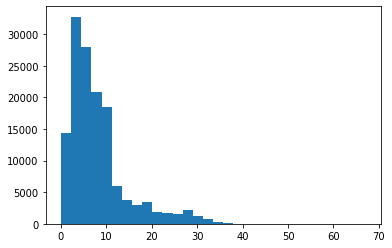

In [124]:
plt.hist([len(review) for review in x_train], bins=30)
plt.show()

- 리뷰의 길이를 단어 40개로 한정

In [125]:
maxLen = 40
x_train = tf.keras.preprocessing.sequence.pad_sequences(x_train, maxlen=maxLen)
x_test = tf.keras.preprocessing.sequence.pad_sequences(x_test, maxlen=maxLen)

In [131]:
embedding_dim = 100

model = tf.keras.models.Sequential()
model.add( tf.keras.layers.Embedding( max_words, embedding_dim, input_length=maxLen) )
model.add( tf.keras.layers.Flatten() )
model.add( tf.keras.layers.Dense( 32, activation='relu'))
model.add( tf.keras.layers.Dense( 1, activation='sigmoid'))

In [132]:
model.compile(
    loss='binary_crossentropy',
    metrics=['acc'],
    optimizer='rmsprop'
)

In [133]:
y_train = np.asarray(y_train)

In [134]:
hist = model.fit(x_train, y_train, epochs=10, batch_size=256, validation_split=0.2)

2022-02-11 16:44:48.827265: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 17982720 exceeds 10% of free system memory.


Epoch 1/10
440/440 [==============================] - 7s 11ms/step - loss: 0.5151 - acc: 0.7303 - val_loss: 0.3835 - val_acc: 0.8234
Epoch 2/10
440/440 [==============================] - 5s 11ms/step - loss: 0.3180 - acc: 0.8638 - val_loss: 0.3623 - val_acc: 0.8391
Epoch 3/10
440/440 [==============================] - 5s 11ms/step - loss: 0.2724 - acc: 0.8879 - val_loss: 0.3727 - val_acc: 0.8407
Epoch 4/10
440/440 [==============================] - 5s 10ms/step - loss: 0.2155 - acc: 0.9160 - val_loss: 0.4124 - val_acc: 0.8343
Epoch 5/10
440/440 [==============================] - 5s 10ms/step - loss: 0.1731 - acc: 0.9331 - val_loss: 0.4666 - val_acc: 0.8219
Epoch 6/10
440/440 [==============================] - 5s 10ms/step - loss: 0.1499 - acc: 0.9432 - val_loss: 0.5272 - val_acc: 0.8123
Epoch 7/10
440/440 [==============================] - 5s 10ms/step - loss: 0.1318 - acc: 0.9507 - val_loss: 0.5535 - val_acc: 0.8132
Epoch 8/10
440/440 [==============================] - 5s 10ms/step - 

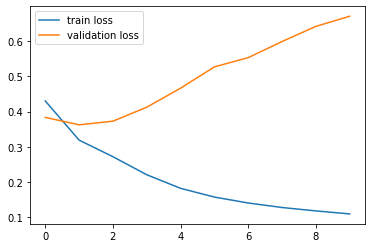

In [135]:
plt.plot( hist.history['loss'], label='train loss')
plt.plot( hist.history['val_loss'], label='validation loss')
plt.legend()
plt.show()

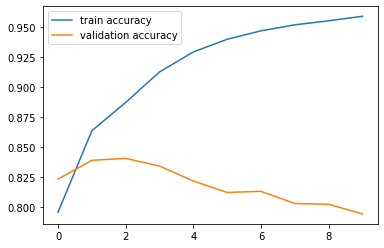

In [136]:
plt.plot( hist.history['acc'], label='train accuracy')
plt.plot( hist.history['val_acc'], label='validation accuracy')
plt.legend()
plt.show()

# RNN

## IMDB에 RNN 사용해보기

In [143]:
from tensorflow.keras.datasets import imdb

In [144]:
max_features = 10000
maxlen = 500
batch_size = 32
(x_train, y_train), (x_test, y_test) = imdb.load_data(num_words=max_features)

In [145]:
x_train[:2]

array([list([1, 14, 22, 16, 43, 530, 973, 1622, 1385, 65, 458, 4468, 66, 3941, 4, 173, 36, 256, 5, 25, 100, 43, 838, 112, 50, 670, 2, 9, 35, 480, 284, 5, 150, 4, 172, 112, 167, 2, 336, 385, 39, 4, 172, 4536, 1111, 17, 546, 38, 13, 447, 4, 192, 50, 16, 6, 147, 2025, 19, 14, 22, 4, 1920, 4613, 469, 4, 22, 71, 87, 12, 16, 43, 530, 38, 76, 15, 13, 1247, 4, 22, 17, 515, 17, 12, 16, 626, 18, 2, 5, 62, 386, 12, 8, 316, 8, 106, 5, 4, 2223, 5244, 16, 480, 66, 3785, 33, 4, 130, 12, 16, 38, 619, 5, 25, 124, 51, 36, 135, 48, 25, 1415, 33, 6, 22, 12, 215, 28, 77, 52, 5, 14, 407, 16, 82, 2, 8, 4, 107, 117, 5952, 15, 256, 4, 2, 7, 3766, 5, 723, 36, 71, 43, 530, 476, 26, 400, 317, 46, 7, 4, 2, 1029, 13, 104, 88, 4, 381, 15, 297, 98, 32, 2071, 56, 26, 141, 6, 194, 7486, 18, 4, 226, 22, 21, 134, 476, 26, 480, 5, 144, 30, 5535, 18, 51, 36, 28, 224, 92, 25, 104, 4, 226, 65, 16, 38, 1334, 88, 12, 16, 283, 5, 16, 4472, 113, 103, 32, 15, 16, 5345, 19, 178, 32]),
       list([1, 194, 1153, 194, 8255, 78, 228,

## 네트워크 구성

In [146]:
model = tf.keras.models.Sequential()
model.add(tf.keras.layers.Embedding(max_features, 32))
model.add(tf.keras.layers.SimpleRNN(32))
model.add(tf.keras.layers.Dense(1, activation='sigmoid'))

model.compile(
    loss = 'binary_crossentropy',
    metrics = ['acc'],
    optimizer = 'rmsprop')

In [148]:
x_train = tf.keras.preprocessing.sequence.pad_sequences(x_train, maxlen=maxlen)
x_test = tf.keras.preprocessing.sequence.pad_sequences(x_test, maxlen=maxlen)

In [150]:
hist = model.fit(x_train, y_train, epochs=10, batch_size=128, validation_split=0.2)

2022-02-11 17:32:26.945854: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 40000000 exceeds 10% of free system memory.


Epoch 1/10
157/157 [==============================] - 61s 385ms/step - loss: 0.6509 - acc: 0.6043 - val_loss: 0.4645 - val_acc: 0.7994
Epoch 2/10
157/157 [==============================] - 66s 418ms/step - loss: 0.3899 - acc: 0.8408 - val_loss: 0.4239 - val_acc: 0.8258
Epoch 3/10
157/157 [==============================] - 80s 513ms/step - loss: 0.2948 - acc: 0.8831 - val_loss: 0.3760 - val_acc: 0.8352
Epoch 4/10
157/157 [==============================] - 94s 596ms/step - loss: 0.2374 - acc: 0.9096 - val_loss: 0.4786 - val_acc: 0.8088
Epoch 5/10
157/157 [==============================] - 93s 591ms/step - loss: 0.1862 - acc: 0.9288 - val_loss: 0.4025 - val_acc: 0.8290
Epoch 6/10
157/157 [==============================] - 93s 596ms/step - loss: 0.1427 - acc: 0.9495 - val_loss: 0.4930 - val_acc: 0.8286
Epoch 7/10
157/157 [==============================] - 93s 594ms/step - loss: 0.1018 - acc: 0.9651 - val_loss: 0.5152 - val_acc: 0.8058
Epoch 8/10
157/157 [==============================] - 9

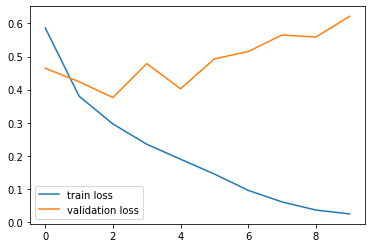

In [151]:
plt.plot( hist.history['loss'], label='train loss')
plt.plot( hist.history['val_loss'], label='validation loss')
plt.legend()
plt.show()

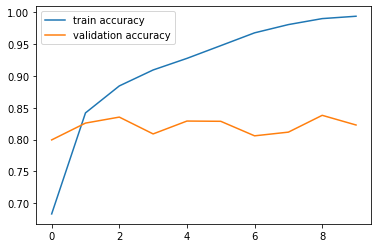

In [152]:
plt.plot( hist.history['acc'], label='train accuracy')
plt.plot( hist.history['val_acc'], label='validation accuracy')
plt.legend()
plt.show()